In [106]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib.colors import ListedColormap
%matplotlib inline

# Data Prep and Cleaning

In [107]:
events = pd.read_csv('/Users/simarmalhan/Downloads/athlete_events.csv')

In [108]:
events

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,135569,Andrzej ya,M,29.0,179.0,89.0,Poland-1,POL,1976 Winter,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,NaN
271112,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",NaN
271113,135570,Piotr ya,M,27.0,176.0,59.0,Poland,POL,2014 Winter,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",NaN
271114,135571,Tomasz Ireneusz ya,M,30.0,185.0,96.0,Poland,POL,1998 Winter,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,NaN


In [109]:
noc = pd.read_csv('/Users/simarmalhan/Downloads/noc_regions.csv')

In [110]:
noc

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN
...,...,...,...
225,YEM,Yemen,NaN
226,YMD,Yemen,South Yemen
227,YUG,Serbia,Yugoslavia
228,ZAM,Zambia,NaN


In [111]:
# The focus of this EDA will be solely on Summer Olympics so we will filter the Winter Season out

events = events[events['Season'] == 'Summer']

In [112]:
events

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
26,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271106,135565,Fernando scar Zylberberg,M,27.0,168.0,76.0,Argentina,ARG,2004 Summer,2004,Summer,Athina,Hockey,Hockey Men's Hockey,NaN
271107,135566,"James Francis ""Jim"" Zylker",M,21.0,175.0,75.0,United States,USA,1972 Summer,1972,Summer,Munich,Football,Football Men's Football,NaN
271108,135567,Aleksandr Viktorovich Zyuzin,M,24.0,183.0,72.0,Russia,RUS,2000 Summer,2000,Summer,Sydney,Rowing,Rowing Men's Lightweight Coxless Fours,NaN
271109,135567,Aleksandr Viktorovich Zyuzin,M,28.0,183.0,72.0,Russia,RUS,2004 Summer,2004,Summer,Athina,Rowing,Rowing Men's Lightweight Coxless Fours,NaN


In [113]:
events.columns

Index(['ID', 'Name', 'Sex', 'Age', 'Height', 'Weight', 'Team', 'NOC', 'Games',
       'Year', 'Season', 'City', 'Sport', 'Event', 'Medal'],
      dtype='object')

In [114]:
len(events.columns)

15

In [115]:
len(events)

222552

In [116]:
events.info()

<class 'pandas.core.frame.DataFrame'>
Index: 222552 entries, 0 to 271110
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      222552 non-null  int64  
 1   Name    222552 non-null  object 
 2   Sex     222552 non-null  object 
 3   Age     213363 non-null  float64
 4   Height  170695 non-null  float64
 5   Weight  168698 non-null  float64
 6   Team    222552 non-null  object 
 7   NOC     222552 non-null  object 
 8   Games   222552 non-null  object 
 9   Year    222552 non-null  int64  
 10  Season  222552 non-null  object 
 11  City    222552 non-null  object 
 12  Sport   222552 non-null  object 
 13  Event   222552 non-null  object 
 14  Medal   34088 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 27.2+ MB


In [117]:
events.describe()

,ID,Age,Height,Weight,Year
count,222552.000000,213363.000000,170695.000000,168698.00000,222552.000000
mean,67998.925712,25.674053,175.515551,70.68906,1976.317094
std,39139.038228,6.699839,10.914725,14.80394,30.942802
min,1.000000,10.000000,127.000000,25.00000,1896.000000
25%,34000.750000,21.000000,168.000000,60.00000,1956.000000
50%,68302.500000,24.000000,175.000000,70.00000,1984.000000
75%,101881.000000,28.000000,183.000000,79.00000,2000.000000
max,135568.000000,97.000000,226.000000,214.00000,2016.000000


In [118]:
noc.describe()

,NOC,region,notes
count,230,227,21
unique,230,206,21
top,AFG,Germany,Netherlands Antilles
freq,1,4,1


## Merging two datasets to form one

In [119]:
datadf = pd.merge(events, noc, how = 'left', on = 'NOC')

In [120]:
datadf.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN,Netherlands,NaN


## Finding and replacing null values in the dataset

In [121]:
datadf.isnull()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True
2,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,True
3,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222547,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True
222548,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True
222549,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True
222550,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True


In [122]:
datadf.isnull().sum()

ID             0
Name           0
Sex            0
Age         9189
Height     51857
Weight     53854
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     188464
region       370
notes     218151
dtype: int64

*Lots of nan values for medals is expected because there are thousands of athletes who compete for just 3 spots.*

In [123]:
# Let's drop the 'notes' column from our dataframe

datadf.drop(['notes'], inplace=True, axis=1)

In [124]:
datadf.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN,Netherlands


## Filling the missing values of age, height and weight with their respective means

In [125]:
datadf['Age'].fillna(value = datadf['Age'].mean(), inplace = True)

In [126]:
datadf['Height'].fillna(value = datadf['Height'].mean(), inplace = True)

In [127]:
datadf['Weight'].fillna(value = datadf['Weight'].mean(), inplace = True)

In [128]:
datadf['region'].unique()

array(['China', 'Denmark', 'Netherlands', 'Finland', 'Norway', 'Romania',
       'Estonia', 'France', 'Morocco', 'Spain', 'Egypt', 'Iran',
       'Bulgaria', 'Italy', 'Chad', 'Azerbaijan', 'Sudan', 'Russia',
       'Argentina', 'Cuba', 'Belarus', 'Greece', 'Cameroon', 'Turkey',
       'Chile', 'Mexico', 'USA', 'Nicaragua', 'Hungary', 'Nigeria',
       'Algeria', 'Kuwait', 'Bahrain', 'Pakistan', 'Iraq', 'Syria',
       'Lebanon', 'Qatar', 'Malaysia', 'Germany', 'Canada', 'Ireland',
       'Australia', 'South Africa', 'Eritrea', 'Tanzania', 'Jordan',
       'Tunisia', 'Libya', 'Belgium', 'Djibouti', 'Palestine', 'Comoros',
       'Kazakhstan', 'Brunei', 'India', 'Saudi Arabia', 'Maldives',
       'Ethiopia', 'United Arab Emirates', 'Yemen', 'Indonesia',
       'Philippines', nan, 'Uzbekistan', 'Kyrgyzstan', 'Tajikistan',
       'Japan', 'Republic of Congo', 'Switzerland', 'Brazil', 'Monaco',
       'Israel', 'Uruguay', 'Sweden', 'Sri Lanka', 'Armenia',
       'Ivory Coast', 'Kenya', 'Ben

*Okay, I understand what the region column is about. I think it would be best to fill the missing values with 'region unknown' or something like that.*

In [129]:
datadf['region'].fillna(value = 'Region Unknown', inplace = True)

In [130]:
# replacing medal nan values with 'Medal Not Won'

datadf['Medal'].fillna(value = 'Medal Not Won', inplace = True)

In [131]:
datadf.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.000000,80.00000,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,Medal Not Won,China
1,2,A Lamusi,M,23.0,170.000000,60.00000,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,Medal Not Won,China
2,3,Gunnar Nielsen Aaby,M,24.0,175.515551,70.68906,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,Medal Not Won,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,175.515551,70.68906,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.000000,70.68906,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,Medal Not Won,Netherlands


In [132]:
datadf.isnull().sum()

ID        0
Name      0
Sex       0
Age       0
Height    0
Weight    0
Team      0
NOC       0
Games     0
Year      0
Season    0
City      0
Sport     0
Event     0
Medal     0
region    0
dtype: int64

## Checking for duplicate values

In [133]:
datadf.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
222547    False
222548    False
222549    False
222550    False
222551    False
Length: 222552, dtype: bool

In [134]:
datadf.duplicated().sum()

1385

*Let's drop these duplicate values using the .drop_duplicates() method. The argument keep = 'First' will ensure that pandas will delete all duplicate rows but not the first one.*

In [135]:
datadf.drop_duplicates(keep = 'first', inplace = True)

In [136]:
datadf.duplicated().sum()

0

*Let's see how many Gold Medals India has won.*

In [137]:
datadf[(datadf['Team'] == 'India') & (datadf['Medal'] == 'Gold')]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
4186,2699,Shaukat Ali,M,30.000000,175.515551,70.68906,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India
4190,2703,Syed Mushtaq Ali,M,22.000000,165.000000,61.00000,India,IND,1964 Summer,1964,Summer,Tokyo,Hockey,Hockey Men's Hockey,Gold,India
4460,2864,Richard James Allen,M,25.000000,172.000000,70.68906,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India
4461,2864,Richard James Allen,M,30.000000,172.000000,70.68906,India,IND,1932 Summer,1932,Summer,Los Angeles,Hockey,Hockey Men's Hockey,Gold,India
4462,2864,Richard James Allen,M,34.000000,172.000000,70.68906,India,IND,1936 Summer,1936,Summer,Berlin,Hockey,Hockey Men's Hockey,Gold,India
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191759,117232,Dung Dung Sylvanus,M,31.000000,160.000000,62.00000,India,IND,1980 Summer,1980,Summer,Moskva,Hockey,Hockey Men's Hockey,Gold,India
193964,118553,Carlyle Carrol Tapsell,M,23.000000,182.000000,70.68906,India,IND,1932 Summer,1932,Summer,Los Angeles,Hockey,Hockey Men's Hockey,Gold,India
193965,118553,Carlyle Carrol Tapsell,M,27.000000,182.000000,70.68906,India,IND,1936 Summer,1936,Summer,Berlin,Hockey,Hockey Men's Hockey,Gold,India
205949,125560,"Max ""Maxie"" Vaz",M,25.674053,175.515551,70.68906,India,IND,1948 Summer,1948,Summer,London,Hockey,Hockey Men's Hockey,Gold,India


*This is false info - India has not won 131 Gold Medals in the course of Olympics history.
So is our dataset wrong? Well not exactly, here, instead of tallying the medal of a team event as one medal to the nation, Pandas is counting and giving us a summation of all the individials who were a part of the team.
For now let us leave this as it as. This will not have a big impact on our visulisations as very country in this dataset will have this advantage!*

# EDA

## Which country sent the most number of athletes to Summer Olympics?

In [138]:
datadf['Team'].value_counts().head(20)

Team
United States    14277
Great Britain    10169
France            9850
Italy             8004
Germany           7282
Australia         6975
Canada            6636
Japan             6213
Hungary           6034
Sweden            5773
Netherlands       4993
Spain             4830
Poland            4781
Soviet Union      4584
China             4179
Switzerland       3868
Romania           3722
Brazil            3708
South Korea       3584
Russia            3528
Name: count, dtype: int64

/Users/simarmalhan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1507: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/Users/simarmalhan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1507: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/Users/simarmalhan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1507: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/Users/simarmalhan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1507: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/Users/simarmalhan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1507: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/Users/simarmalhan/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1609: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/Users/simarmalhan/ana

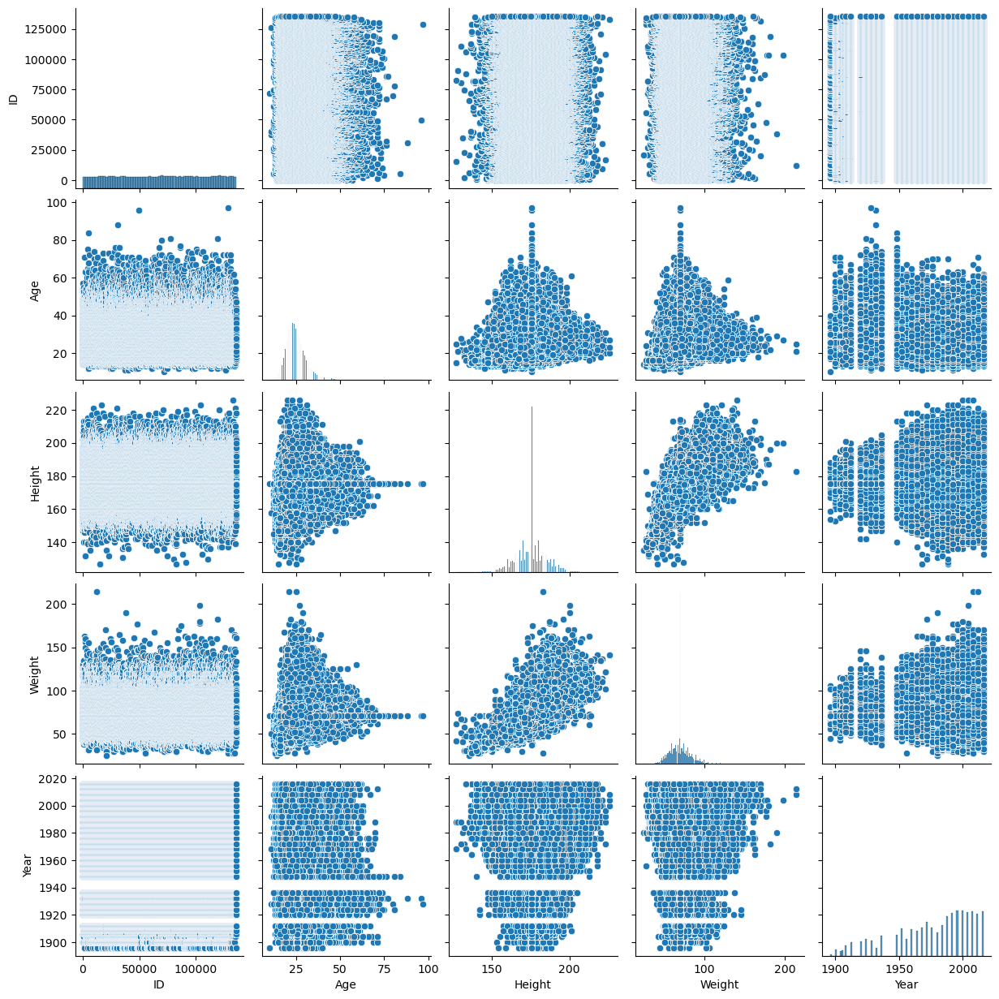

In [139]:
sns.pairplot(datadf, palette = 'theme')

## The overall spread of the age of athletes in the Summer Olympics

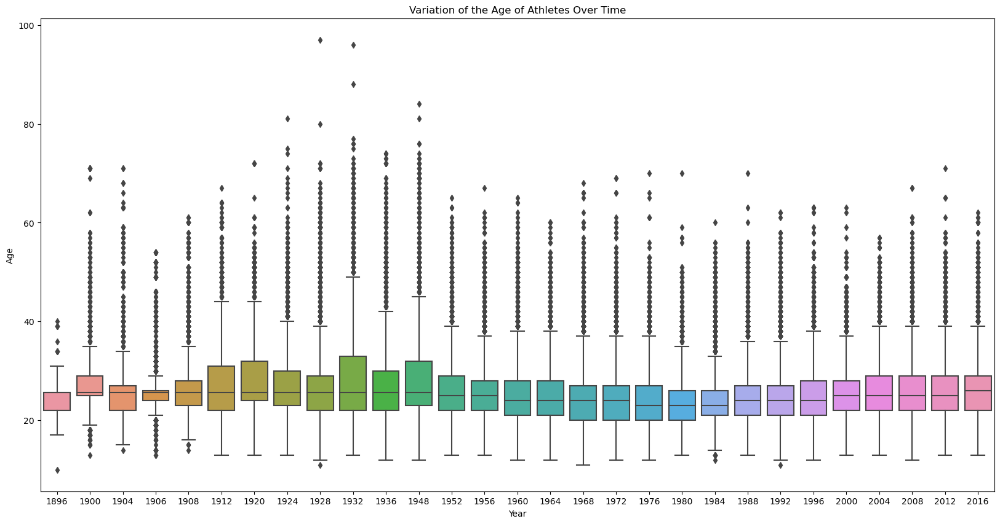

In [140]:
plt.figure(figsize = (20, 10))
sns.boxplot(data = datadf, x = 'Year', y = 'Age')
plt.title('Variation of the Age of Athletes Over Time')
plt.show()

In [141]:
# Plotting the same graph but interactive using boxplot using Plotly

px.box(datadf, x = 'Year',y = 'Age',)

*Inference: The median age of athletes has been 25 years for most of the Olympic games over the period of 100 years.*

## The variation in participants over the years.

In [148]:
datadf.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.000000,80.00000,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,Medal Not Won,China
1,2,A Lamusi,M,23.0,170.000000,60.00000,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,Medal Not Won,China
2,3,Gunnar Nielsen Aaby,M,24.0,175.515551,70.68906,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,Medal Not Won,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,175.515551,70.68906,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.000000,70.68906,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,Medal Not Won,Netherlands


In [149]:
trendbyyear = datadf.groupby(['Year'], as_index = False)['ID'].count().sort_values(by = 'Year', ascending = True)

In [150]:
trendbyyear

,Year,ID
0,1896,380
1,1900,1898
2,1904,1301
3,1906,1733
4,1908,3069
5,1912,4040
6,1920,4292
7,1924,5110
8,1928,4656
9,1932,2465


In [151]:
px.line(trendbyyear, x = 'Year', y = 'ID', markers = 'o')

<Axes: xlabel='Year', ylabel='ID'>

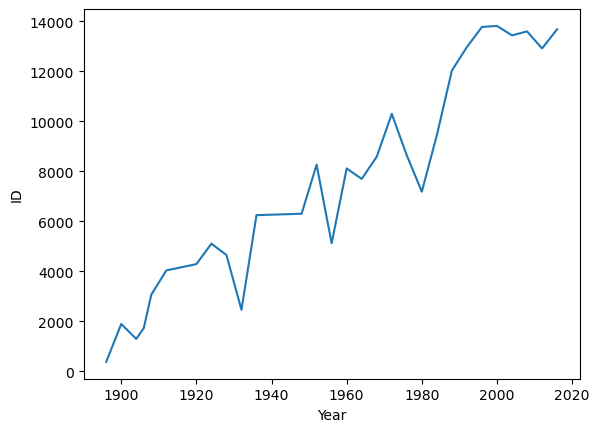

In [152]:
sns.lineplot(trendbyyear, x = 'Year', y = 'ID')

In [153]:
# Let's make a histogram

px.histogram(trendbyyear, x = 'Year', y = 'ID', nbins = 70)

## Top 10 Nations to win most number of Gold Medals

In [156]:
medal_df = datadf[datadf['Medal'] == 'Gold'].groupby(['Team'], as_index = False).count().sort_values(by = 'ID', ascending = False).head(10)

In [157]:
medal_df.head(10)

,Team,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,region
212,United States,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333,2333
192,Soviet Union,830,830,830,830,830,830,830,830,830,830,830,830,830,830,830
84,Germany,564,564,564,564,564,564,564,564,564,564,564,564,564,564,564
108,Italy,492,492,492,492,492,492,492,492,492,492,492,492,492,492,492
86,Great Britain,481,481,481,481,481,481,481,481,481,481,481,481,481,481,481
98,Hungary,432,432,432,432,432,432,432,432,432,432,432,432,432,432,432
77,France,421,421,421,421,421,421,421,421,421,421,421,421,421,421,421
60,East Germany,337,337,337,337,337,337,337,337,337,337,337,337,337,337,337
10,Australia,336,336,336,336,336,336,336,336,336,336,336,336,336,336,336
196,Sweden,326,326,326,326,326,326,326,326,326,326,326,326,326,326,326


In [165]:
gold_plot = px.pie(medal_df.head(10), values = 'ID', hole = 0.5, names = 'Team', title = '<b>Top 10 Gold Winning Nations</b>')

In [166]:
gold_plot

## Top 10 Nations to win most number of Silver Medals

In [171]:
silvermedal_df = datadf[datadf['Medal'] == 'Silver'].groupby(['Team'], as_index = False).count().sort_values(by = 'ID', ascending = False).head(10)

In [172]:
silvermedal_df

,Team,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,region
237,United States,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241,1241
200,Soviet Union,635,635,635,635,635,635,635,635,635,635,635,635,635,635,635
82,Great Britain,576,576,576,576,576,576,576,576,576,576,576,576,576,576,576
77,Germany,513,513,513,513,513,513,513,513,513,513,513,513,513,513,513
70,France,485,485,485,485,485,485,485,485,485,485,485,485,485,485,485
106,Italy,467,467,467,467,467,467,467,467,467,467,467,467,467,467,467
6,Australia,450,450,450,450,450,450,450,450,450,450,450,450,450,450,450
210,Sweden,350,350,350,350,350,350,350,350,350,350,350,350,350,350,350
94,Hungary,328,328,328,328,328,328,328,328,328,328,328,328,328,328,328
31,China,299,299,299,299,299,299,299,299,299,299,299,299,299,299,299


In [173]:
px.pie(silvermedal_df, names = 'Team', values = 'ID', hole = 0.5, title = 'Top 10 Teams to Win Silver Medal')

In [177]:
bronzemedal_df = datadf[datadf['Medal'] == 'Bronze'].groupby(['Team'], as_index = False).count().sort_values(by = 'ID', ascending = False).head(10)

In [178]:
px.pie(bronzemedal_df, names = 'Team', values = 'ID', hole = 0.5, title = 'Top 10 Teams to win Bronze Medal')

## Year-wise breakup of the the top performing team - USA

In [179]:
datadf.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.000000,80.00000,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,Medal Not Won,China
1,2,A Lamusi,M,23.0,170.000000,60.00000,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,Medal Not Won,China
2,3,Gunnar Nielsen Aaby,M,24.0,175.515551,70.68906,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,Medal Not Won,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,175.515551,70.68906,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.000000,70.68906,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,Medal Not Won,Netherlands


In [191]:
usamedaldf = datadf[datadf['Team'] == 'United States'].reset_index()

In [194]:
usamedaldf.head(10)

,index,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,124,84,Stephen Anthony Abas,M,26.0,165.000000,55.00000,United States,USA,2004 Summer,2004,Summer,Athina,Wrestling,"Wrestling Men's Featherweight, Freestyle",Silver,USA
1,207,142,"David ""Dave"" Abbott",M,26.0,183.000000,75.00000,United States,USA,1928 Summer,1928,Summer,Amsterdam,Athletics,"Athletics Men's 5,000 metres",Medal Not Won,USA
2,213,149,Mara Katherine Abbott,F,30.0,163.000000,52.00000,United States,USA,2016 Summer,2016,Summer,Rio de Janeiro,Cycling,"Cycling Women's Road Race, Individual",Medal Not Won,USA
3,214,150,Margaret Ives Abbott (-Dunne),F,23.0,175.515551,70.68906,United States,USA,1900 Summer,1900,Summer,Paris,Golf,Golf Women's Individual,Gold,USA
4,215,151,Mary Perkins Ives Abbott (Perkins-),F,42.0,175.515551,70.68906,United States,USA,1900 Summer,1900,Summer,Paris,Golf,Golf Women's Individual,Medal Not Won,USA
5,217,153,Monica Cecilia Abbott,F,23.0,191.000000,88.00000,United States,USA,2008 Summer,2008,Summer,Beijing,Softball,Softball Women's Softball,Silver,USA
6,242,165,Nia Nicole Abdallah,F,20.0,175.000000,56.00000,United States,USA,2004 Summer,2004,Summer,Athina,Taekwondo,Taekwondo Women's Featherweight,Silver,USA
7,397,256,"Abdihakim ""Abdi"" Abdirahman",M,23.0,178.000000,61.00000,United States,USA,2000 Summer,2000,Summer,Sydney,Athletics,"Athletics Men's 10,000 metres",Medal Not Won,USA
8,398,256,"Abdihakim ""Abdi"" Abdirahman",M,27.0,178.000000,61.00000,United States,USA,2004 Summer,2004,Summer,Athina,Athletics,"Athletics Men's 10,000 metres",Medal Not Won,USA
9,399,256,"Abdihakim ""Abdi"" Abdirahman",M,31.0,178.000000,61.00000,United States,USA,2008 Summer,2008,Summer,Beijing,Athletics,"Athletics Men's 10,000 metres",Medal Not Won,USA


In [219]:
usayearlymedals = usamedaldf.groupby(['Year', 'Medal']).size().unstack(fill_value=0).reset_index()

In [220]:
usayearlymedals

Medal,Year,Bronze,Gold,Medal Not Won,Silver
0,1896,2,11,7,7
1,1900,13,18,69,14
2,1904,66,65,624,68
3,1906,6,12,57,6
4,1908,15,34,153,16
5,1912,36,46,257,25
6,1920,38,111,279,45
7,1924,49,91,273,34
8,1928,17,47,294,24
9,1932,61,67,355,42


## Medals breakup over the years

In [222]:
# Melting the DataFrame to long-form so that we can make a stacked bar chart
usayearlymedals_melted = usayearlymedals.melt(id_vars='Year', value_vars=['Bronze', 'Gold', 'Silver'], var_name='Medal', value_name='Count')

# Plotting with plotly.express
fig = px.bar(usayearlymedals_melted, x='Year', y='Count', color='Medal', barmode='stack')
fig.show()

## Year wise breakup of the medals wrt gender in USA

In [228]:
usagenderdf = usamedaldf[(usamedaldf['Medal'] == 'Gold') |
           (usamedaldf['Medal'] == 'Silver') |
           (usamedaldf['Medal'] == 'Bronze')].groupby(['Year', 'Sex'], as_index = False).count().sort_values(
    by = 'ID', ascending = False)

In [229]:
usagenderdf

,Year,Sex,index,ID,Name,Age,Height,Weight,Team,NOC,Games,Season,City,Sport,Event,Medal,region
35,1984,M,212,212,212,212,212,212,212,212,212,212,212,212,212,212,212
4,1904,M,193,193,193,193,193,193,193,193,193,193,193,193,193,193,193
9,1920,M,180,180,180,180,180,180,180,180,180,180,180,180,180,180,180
46,2008,F,158,158,158,158,158,158,158,158,158,158,158,158,158,158,158
11,1924,M,155,155,155,155,155,155,155,155,155,155,155,155,155,155,155
48,2012,F,153,153,153,153,153,153,153,153,153,153,153,153,153,153,153
47,2008,M,151,151,151,151,151,151,151,151,151,151,151,151,151,151,151
50,2016,F,145,145,145,145,145,145,145,145,145,145,145,145,145,145,145
15,1932,M,142,142,142,142,142,142,142,142,142,142,142,142,142,142,142
44,2004,F,142,142,142,142,142,142,142,142,142,142,142,142,142,142,142


In [239]:
usagenderdf = (usamedaldf.query("Medal == 'Gold' or Medal == 'Silver' or Medal == 'Bronze'")
               .groupby(['Year', 'Sex'], as_index=False)['ID'].count())

# Create a bar plot using the 'ID' column for the y-axis
fig = px.bar(usagenderdf, x='Year', y='ID', color='Sex', barmode='stack', labels={'ID': 'Count'})
fig.show()

In [246]:
usayearlymedals = usamedaldf.groupby(['Year', 'Medal'], as_index=False).count()

In [247]:
useyearlymedals

size                          
Medal Bronze Gold Medal Not Won Silver
Year                                  
1896       2   11             7      7
1900      13   18            69     14
1904      66   65           624     68
1906       6   12            57      6
1908      15   34           153     16
1912      36   46           257     25
1920      38  111           279     45
1924      49   91           273     34
1928      17   47           294     24
1932      61   67           355     42
1936      16   51           362     29
1948      33   80           269     30
1952      28   73           314     21
1956      20   59           310     42
1960      19   78           298     23
1964      29   95           323     35
1968      35   99           363     32
1972      43   69           403     59
1976      36   70           390     58
1984      50  186           341    116
1988      54   87           508     66
1992      85   87           506     50
1996      52  157           572     46
2000      51  128           508     61
2004      69  115           447     75
2008      78  121           435    110
2012      44  139           431     55
2016      67  137           443     52